In [161]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [162]:
input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image29.jpg"

In [163]:
img = cv2.imread(input_path)

To be used while working in RBC

In [172]:
def extract_cell_size(image):
    # Extract cell size
    # Implement your code to measure the size of the cell
    image_copy = image.copy()
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # plt.subplot(121);plt.imshow(gray)

    # Perform image processing operations to segment the cell
    # Example: Thresholding to segment the cell
    _, binary = cv2.threshold(
        gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt.subplot(122);plt.imshow(binary)
    # Find contours of the cell
    contours, _ = cv2.findContours(
        binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Get the center coordinates of the image
    height, width = gray.shape[:2]
    center_x = width // 2
    center_y = height // 2
    # Filter contours based on their centroid position
    selected_contours = []
    for contour in contours:
        contour_arr = np.squeeze(contour)
        # Calculate centroid coordinates
        M = cv2.moments(contour_arr)
        centroid_x = int(M["m10"] / M["m00"])
        centroid_y = int(M["m01"] / M["m00"])

        # Define a threshold to determine proximity to the center
        threshold = 1000  # Adjust as needed

        # Check if the centroid is near the center
        if abs(centroid_x - center_x) <= threshold and abs(centroid_y - center_y) <= threshold:
            selected_contours.append(contour)
    cv2.drawContours(image_copy, selected_contours, -1, (0, 255, 0), 2)
    plt.imshow(image_copy)
    # Calculate cell size (area) of the largest contour
    if len(contours) > 0:
        areas = [cv2.contourArea(contour) for contour in contours]
        cell_size = max(areas)
    else:
        cell_size = 0

    return cell_size

133379.0

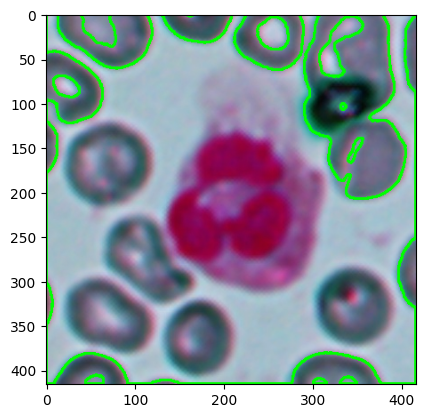

In [173]:
extract_cell_size(img)

In [130]:
ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

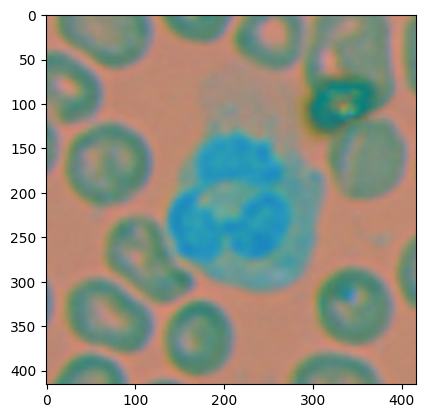

In [131]:
plt.imshow(ycrcb)

In [132]:
y, cr, cb = cv2.split(ycrcb)

In [140]:
def calculate_features(image):
    # Convert the image to grayscale
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the gradient magnitude using the Sobel operator
    gradient = cv2.Sobel(image, cv2.CV_64F, 3, 3, ksize=7)
    gradient = np.absolute(gradient)
    gradient = np.uint8(gradient)

    # Calculate the solidity of the largest contour
    _, binary = cv2.threshold(
        gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(
        binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) > 0:
        areas = [cv2.contourArea(contour) for contour in contours]
        max_area_idx = np.argmax(areas)
        largest_contour = contours[max_area_idx]
        hull = cv2.convexHull(largest_contour)
        solidity = cv2.contourArea(largest_contour) / cv2.contourArea(hull)
    else:
        solidity = 0

    return gradient, solidity

In [141]:
# Calculate the features
gradient, solidity = calculate_features(ycrcb)

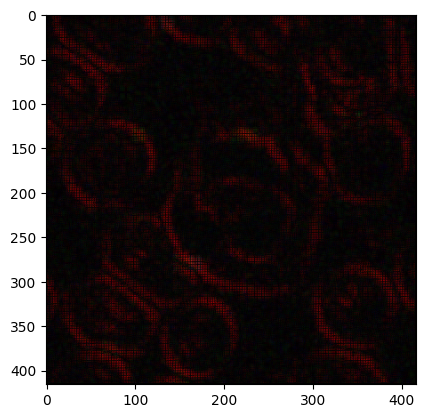

In [142]:
plt.imshow(gradient)

In [136]:
# Find contours of the cell
contours, _ = cv2.findContours(, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [137]:
cv2.drawContours(gradient, contours, -1, (0, 255, 0), 2)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 6, ..., 6, 4, 0],
       [0, 3, 3, ..., 2, 5, 0],
       ...,
       [0, 1, 2, ..., 4, 0, 0],
       [0, 7, 4, ..., 1, 4, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

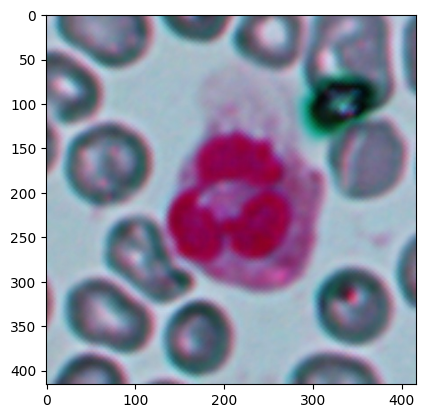

In [138]:
plt.imshow(img)

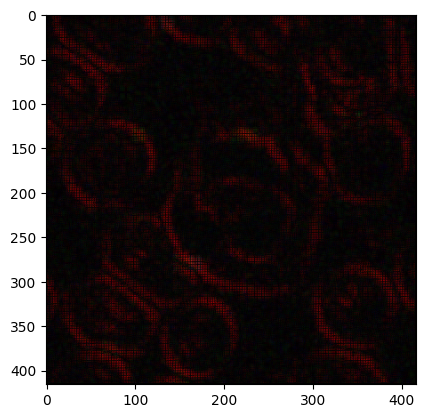

In [143]:
plt.imshow(gradient)

In [114]:
gradient.shape

(416, 416, 3)

In [112]:
b, g, r = cv2.split(gradient)

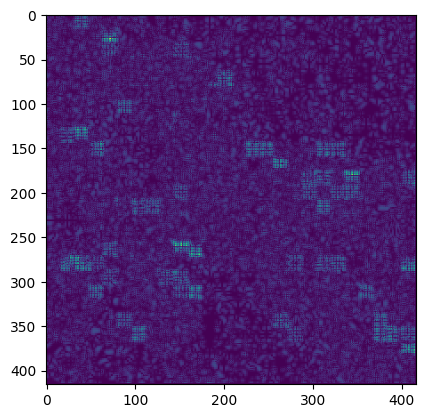

In [116]:
plt.imshow(g)

In [101]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image6.jpg"
image = cv2.imread(input_path)
image_copy = image.copy()

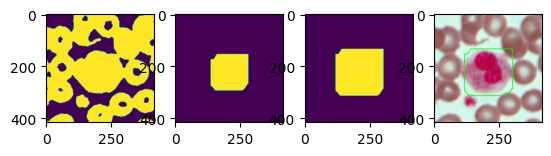

In [102]:


# convert to gray scale image
HSV = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(HSV)

# apply median filter for smoothing
blurM = cv2.medianBlur(h, 5)
# apply gaussian filter for smoothing
blurG = cv2.GaussianBlur(h, (9, 9), 0)
# histogram equalization
histoNorm = cv2.equalizeHist(h)
# create a CLAHE object for
# Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
claheNorm = clahe.apply(h)

# contrast stretching
# Function to map each intensity level to output intensity level.
def pixelVal(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1 / r1) * pix
    elif (r1 < pix and pix <= r2):
        return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1
    else:
        return ((255 - s2) / (255 - r2)) * (pix - r2) + s2


    # Define parameters.


r1 = 70
s1 = 0
r2 = 200
s2 = 255


# Vectorize the function to apply it to each value in the Numpy array.
pixelVal_vec = np.vectorize(pixelVal)

# Apply contrast stretching.
contrast_stretched = pixelVal_vec(h, r1, s1, r2, s2)
contrast_stretched_blurM = pixelVal_vec(blurM, r1, s1, r2, s2)
# Threshold the preprocessed image
_, binary_image = cv2.threshold(contrast_stretched_blurM, 0, 255, cv2.THRESH_BINARY)
# 3. Perform morphological operations to separate touching nuclei
kernel = np.ones((5,5), np.uint8)
#eparated_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=10)
#eroded_image= np.uint8(separated_image)
# Ensure binary_image is of type CV_8UC1
plt.subplot(141);plt.imshow(binary_image)
# 3. Perform morphological operations to separate touching nuclei
#kernel = np.ones((5,5), np.uint8)
separated_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=25)
plt.subplot(142);plt.imshow(separated_image)
separated_image = cv2.erode(separated_image, kernel, iterations = 7)
#plt.subplot(143);plt.imshow(separated_image)
separated_image = cv2.dilate(separated_image, kernel, iterations = 17)
separated_image= np.uint8(separated_image)
plt.subplot(143);plt.imshow(separated_image)
#binary_image = np.uint8(eroded_image)
# Find contours in the binary image

contours, _ = cv2.findContours(separated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
import cv2
import numpy as np

def select_center_contour(contours):
    if len(contours) == 0:
        return None

    # Compute the areas of all contours
    contour_areas = [cv2.contourArea(contour) for contour in contours]

    # Find the index of the contour with the largest area
    max_area_index = np.argmax(contour_areas)

    # Return the contour with the largest area
    center_contour = contours[max_area_index]

    return center_contour

# Select the center contour
center_contour = select_center_contour(contours)

# Check if a center contour was found
if center_contour is not None:
    # Draw the center contour on the image
    cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
    # ... additional processing or analysis using the center contour
else:
    print("No center contour found.")
plt.subplot(144);plt.imshow(image_copy)

In [25]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# read original image
# image = cv2.imread("C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\differential_wbc_data\\train\\images\\95-8-6-1_52_1_jpg.rf.911729036a8250f685e7ed36a2afa840.jpg")
# image = cv2.imread("C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\differential_wbc_data\\train\\images\\95-8-17-1_44_1_jpg.rf.ef64bdd13442f8811448ec0724f3404e.jpg")
image = cv2.imread(
    "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image2.jpg")
image_copy = image.copy()
# convert to gray scale image
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)
cv2.imwrite('gray.png', h)

# apply median filter for smoothing
blurM = cv2.medianBlur(h, 5)
cv2.imwrite('blurM.png', blurM)

# apply gaussian filter for smoothing
blurG = cv2.GaussianBlur(h, (9, 9), 0)
cv2.imwrite('blurG.png', blurG)

# histogram equalization
histoNorm = cv2.equalizeHist(h)
cv2.imwrite('histoNorm.png', histoNorm)


# create a CLAHE object for
# Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
claheNorm = clahe.apply(h)
cv2.imwrite('claheNorm.png', claheNorm)


# contrast stretching
# Function to map each intensity level to output intensity level.
def pixelVal(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1 / r1) * pix
    elif (r1 < pix and pix <= r2):
        return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1
    else:
        return ((255 - s2) / (255 - r2)) * (pix - r2) + s2

    # Define parameters.


r1 = 70
s1 = 0
r2 = 200
s2 = 255

# Vectorize the function to apply it to each value in the Numpy array.
pixelVal_vec = np.vectorize(pixelVal)

# Apply contrast stretching.
contrast_stretched = pixelVal_vec(h, r1, s1, r2, s2)
contrast_stretched_blurM = pixelVal_vec(blurM, r1, s1, r2, s2)

cv2.imwrite('contrast_stretch.png', contrast_stretched)
cv2.imwrite('contrast_stretch_blurM.png',
            contrast_stretched_blurM)

# edge detection using canny edge detector
edge = cv2.Canny(h, 100, 200)
cv2.imwrite('edge.png', edge)

edgeG = cv2.Canny(blurG, 100, 200)
cv2.imwrite('edgeG.png', edgeG)

edgeM = cv2.Canny(blurM, 100, 200)
cv2.imwrite('edgeM.png', edgeM)

True

In [12]:
# Convert the preprocessed image to grayscale
# gray_image = cv2.cvtColor(contrast_stretched_blurM, cv2.COLOR_BGR2GRAY)
# Threshold the preprocessed image
_, binary_image = cv2.threshold(
    contrast_stretched_blurM, 0, 255, cv2.THRESH_BINARY)

In [13]:
# 3. Perform morphological operations to separate touching nuclei
kernel = np.ones((9, 9), np.uint8)
separated_image = cv2.morphologyEx(
    binary_image, cv2.MORPH_OPEN, kernel, iterations=10)
eroded_image = np.uint8(separated_image)

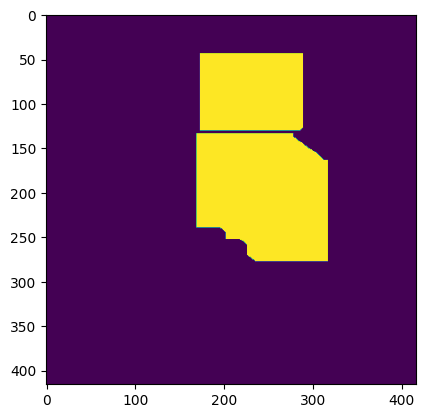

In [14]:
plt.imshow(eroded_image)

In [15]:
# binary_image.shape
# Ensure binary_image is of type CV_8UC1
binary_image = np.uint8(eroded_image)

In [16]:
# Find contours in the binary image
contours, _ = cv2.findContours(
    binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [17]:
import cv2
import numpy as np


def select_center_contour(contours):
    if len(contours) == 0:
        return None

    # Compute the areas of all contours
    contour_areas = [cv2.contourArea(contour) for contour in contours]

    # Find the index of the contour with the largest area
    max_area_index = np.argmax(contour_areas)

    # Return the contour with the largest area
    center_contour = contours[max_area_index]

    return center_contour

In [18]:
# Find contours in the binary image
# contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Select the center contour
center_contour = select_center_contour(contours)

# Check if a center contour was found
if center_contour is not None:
    # Draw the center contour on the image
    cv2.drawContours(image, [center_contour], -1, (0, 255, 0), 2)
    # ... additional processing or analysis using the center contour
else:
    print("No center contour found.")

In [19]:


# Filter contours based on criteria (e.g., area, shape, hierarchy)
filtered_contours = []
for contour in contours:
    # Add your filtering criteria here
    if cv2.contourArea(contour) > 25:
        filtered_contours.append(contour)

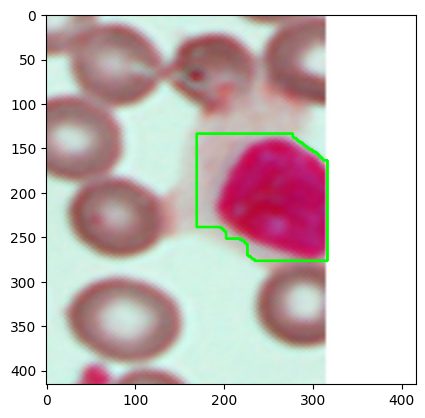

In [20]:
plt.imshow(image)

In [225]:
import os
os.path.join("C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\" +
             os.listdir("cropped_images8")[1])
# C:\Users\krrah\Downloads\Dewinter2023\Final_yolov5x\cropped_images8\final_image2.jpg

'C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image10.jpg'

No center contour found.


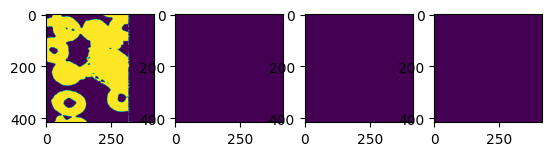

In [21]:
# Code to find the circumference and area of the cytoplasm of wbc cell
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image2.jpg"

image = cv2.imread(input_path)
image_copy = image.copy()
# convert to gray scale image
HSV = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
hsv, S, v = cv2.split(HSV)


# apply median filter for smoothing
blurM = cv2.medianBlur(hsv, 5)
# plt.imshow(blurM)


# contrast stretching
# Function to map each intensity level to output intensity level.
def pixelVal(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1 / r1) * pix
    elif (r1 < pix and pix <= r2):
        return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1
    else:
        return ((255 - s2) / (255 - r2)) * (pix - r2) + s2

    # Define parameters.


r1 = 70
s1 = 0
r2 = 200
s2 = 255


# Vectorize the function to apply it to each value in the Numpy array.
pixelVal_vec = np.vectorize(pixelVal)

# Apply contrast stretching.
contrast_stretched = pixelVal_vec(hsv, r1, s1, r2, s2)
contrast_stretched_blurM = pixelVal_vec(blurM, r1, s1, r2, s2)


_, binary_image = cv2.threshold(
    contrast_stretched_blurM, 0, 255, cv2.THRESH_BINARY)
plt.subplot(141)
plt.imshow(binary_image)
# 3. Perform morphological operations to separate touching nuclei
kernel = np.ones((5, 5), np.uint8)
separated_image = cv2.morphologyEx(
    binary_image, cv2.MORPH_OPEN, kernel, iterations=26)
plt.subplot(142)
plt.imshow(separated_image)
separated_image = cv2.erode(separated_image, kernel, iterations=8)
plt.subplot(143)
plt.imshow(separated_image)
separated_image = cv2.dilate(separated_image, kernel, iterations=17)
separated_image = np.uint8(separated_image)
plt.subplot(144)
plt.imshow(separated_image)
contours, _ = cv2.findContours(
    separated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


def select_center_contour(contours):
    if len(contours) == 0:
        return None

    # Compute the areas of all contours
    contour_areas = [cv2.contourArea(contour) for contour in contours]

    # Find the index of the contour with the largest area
    max_area_index = np.argmax(contour_areas)

    # Return the contour with the largest area
    center_contour = contours[max_area_index]

    return center_contour


# Select the center contour
center_contour = select_center_contour(contours)

# Check if a center contour was found
if center_contour is not None:
    # Draw the center contour on the image
    cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
    # ... additional processing or analysis using the center contour
else:
    print("No center contour found.")


# Filter contours based on criteria (e.g., area, shape, hierarchy)
filtered_contours = []
for contour in contours:
    # Add your filtering criteria here
    if cv2.contourArea(contour) > 25:
        filtered_contours.append(contour)

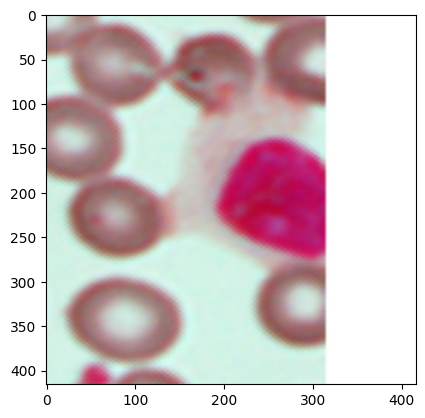

In [22]:
plt.imshow(image_copy)

In [216]:
os.listdir('cropped_images8')[0]

'final_image1.jpg'

In [206]:
input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image10.jpg"
img = cv2.imread(input_path)

No center contour found.
No center contour found.
No center contour found.
No center contour found.
No center contour found.
No center contour found.
No center contour found.
No center contour found.


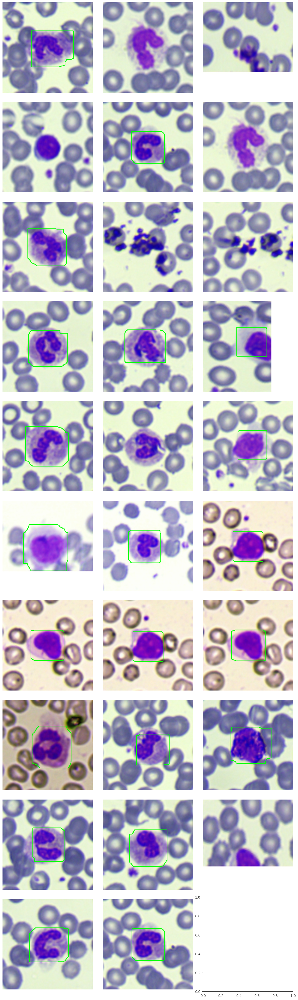

In [205]:
# Final function to detect the cell contour

# Directory containing the images
input_dir = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8"

# List to store the processed images
processed_images = []
Cell_Areas = []
Cell_Perimeters = []

# Iterate over the images in the directory
for filename in os.listdir(input_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        input_path = os.path.join(input_dir, filename)
        image = cv2.imread(input_path)

        # Perform the processing steps
        # image = cv2.imread(input_path)
        image_copy = image.copy()
        # convert to gray scale image
        HSV = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        hsv, s, v = cv2.split(HSV)

        # apply median filter for smoothing
        blurM = cv2.medianBlur(hsv, 5)
        # plt.imshow(blurM)

       # contrast stretching
       # Function to map each intensity level to output intensity level.

        def pixelVal(pix, r1, s1, r2, s2):
            if (0 <= pix and pix <= r1):
                return (s1 / r1) * pix
            elif (r1 < pix and pix <= r2):
                return ((s2 - s1) / (r2 - r1)) * (pix - r1) + s1
            else:
                return ((255 - s2) / (255 - r2)) * (pix - r2) + s2

        # Define parameters.

        r1 = 70
        s1 = 0
        r2 = 200
        s2 = 255

        # Vectorize the function to apply it to each value in the Numpy array.
        pixelVal_vec = np.vectorize(pixelVal)

        # Apply contrast stretching.
        contrast_stretched = pixelVal_vec(hsv, r1, s1, r2, s2)
        contrast_stretched_blurM = pixelVal_vec(blurM, r1, s1, r2, s2)

        _, binary_image = cv2.threshold(
            contrast_stretched_blurM, 0, 255, cv2.THRESH_BINARY)

        # 3. Perform morphological operations to separate touching nuclei
        kernel = np.ones((5, 5), np.uint8)
        separated_image = cv2.morphologyEx(
            binary_image, cv2.MORPH_OPEN, kernel, iterations=25)
        separated_image = cv2.erode(separated_image, kernel, iterations=10)
        separated_image = cv2.dilate(separated_image, kernel, iterations=17)
        separated_image = np.uint8(separated_image)
        # plt.imshow(separated_image)
        contours, _ = cv2.findContours(
            separated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        def select_center_contour(contours):
            if len(contours) == 0:

                Cell_Areas.append(0)
                Cell_Perimeters.append(0)
                return None

            # Compute the areas of all contours
            contour_areas = [cv2.contourArea(contour) for contour in contours]

            # Find the index of the contour with the largest area
            max_area_index = np.argmax(contour_areas)

            # Return the contour with the largest area
            center_contour = contours[max_area_index]
            area = cv2.contourArea(center_contour)
            perimeter = cv2.arcLength(center_contour, True)
            Cell_Areas.append(area)
            Cell_Perimeters.append(perimeter)

            return center_contour

        # Select the center contour
        center_contour = select_center_contour(contours)

        # Check if a center contour was found
        if center_contour is not None:
            # Draw the center contour on the image
            cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
    # ... additional processing or analysis using the center contour
        else:
            print("No center contour found.")

        processed_images.append(image_copy)

'''        # Filter contours based on criteria (e.g., area, shape, hierarchy)
        filtered_contours = []
        for contour in contours:
             # Add your filtering criteria here
             if cv2.contourArea(contour) > 25:
                 filtered_contours.append(contour)
        
                # Add the processed image to the list
                 processed_images.append(image)'''

# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_images) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image in enumerate(processed_images):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

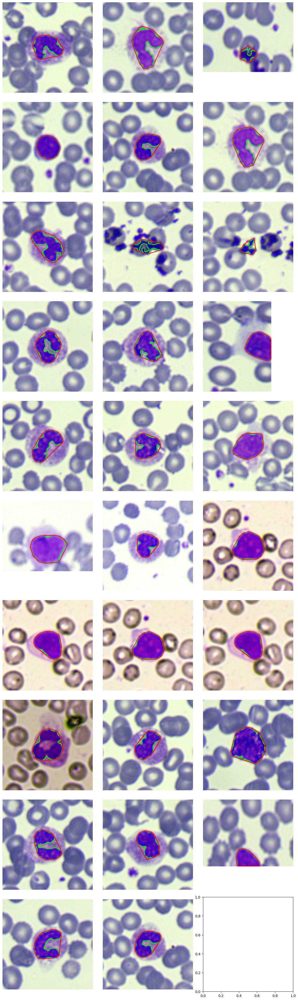

In [247]:
# Final Functionfro nucleus parameters
# Directory containing the images
input_dir = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8"

# List to store the processed images
processed_images = []
Nucleus_Areas = []
Nucleus_Perimeters = []
Area_hull = []
Perimeter_hull = []
# Iterate over the images in the directory
for filename in os.listdir(input_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        input_path = os.path.join(input_dir, filename)
        image = cv2.imread(input_path)

        # Perform the processing steps
        # image = cv2.imread(input_path)
        image_copy = image.copy()

        # plt.imshow(blurM)

        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

        # Define the lower and upper bounds for the green color in the HSV color space
        lower_green = np.array([40, 130, 170])
        upper_green = np.array([90, 255, 255])

       # Threshold the HSV image based on the color range
        img_mask = cv2.inRange(img_hsv, lower_green, upper_green)
        # plt.imshow(img_mask)
        # Find contours in the thresholded image
        contours, _ = cv2.findContours(
            img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    '''# Check if any contours were found
    if len(contours) > 0:
        # Find the largest contour
        largest_contour = max(contours, key=cv2.contourArea)
        
        # Calculate the area and perimeter of the largest contour
        area = cv2.contourArea(largest_contour)
        perimeter = cv2.arcLength(largest_contour, True)'''
    def select_center_contour(contours):
        if len(contours) == 0:
            return None

        # Compute the areas of all contours
        contour_areas = [cv2.contourArea(contour) for contour in contours]

        # Find the index of the contour with the largest area
        max_area_index = np.argmax(contour_areas)

        # Return the contour with the largest area
        center_contour = contours[max_area_index]
        area = cv2.contourArea(center_contour)
        perimeter = cv2.arcLength(center_contour, True)
        Nucleus_Areas.append(area)
        Nucleus_Perimeters.append(perimeter)

        return center_contour

        # Select the center contour
    center_contour = select_center_contour(contours)
    convex_hull = cv2.convexHull(center_contour)
    Area_hull.append(cv2.contourArea(convex_hull))
    Perimeter_hull.append(cv2.arcLength(convex_hull, True))

    # Check if a center contour was found
    if center_contour is not None:
        # Draw the center contour on the image
        cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
        cv2.drawContours(image_copy, [convex_hull], -1, (0, 0, 255), 2)

    # ... additional processing or analysis using the center contour
    else:
        print("No center contour found.")

    '''Areas.append(area)
    Perimeters.append(perimeter)'''
    processed_images.append(image_copy)


# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_images) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image in enumerate(processed_images):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

In [244]:
PARAMS = {"CELL_AREA": Cell_Areas, "CELL_PERIMETER": Cell_Perimeters, "NUCLEUS_AREA": Nucleus_Areas,
          "NUCLEUS_PERIMETER": Nucleus_Perimeters, "CYTO_AREA": Area_hull, "CYTO_PERIMETER": Perimeter_hull}

In [245]:
import pandas as pd
df = pd.DataFrame(PARAMS)
# Convert columns to float type
df = df.astype(float)

In [248]:
df["cell-nucleus_area_r"] = df.CELL_AREA/df.NUCLEUS_AREA
df["cell-nucleus_peri_r"] = df.CELL_PERIMETER/df.NUCLEUS_PERIMETER
df["Solidity"] = df.NUCLEUS_AREA/df.CYTO_AREA
df["Convexity"] = df.CYTO_PERIMETER/df.NUCLEUS_PERIMETER
df["Circularity"] = df.NUCLEUS_PERIMETER * \
    df.NUCLEUS_PERIMETER/(4*np.pi*df.NUCLEUS_AREA)

In [250]:
df.shape

(29, 11)

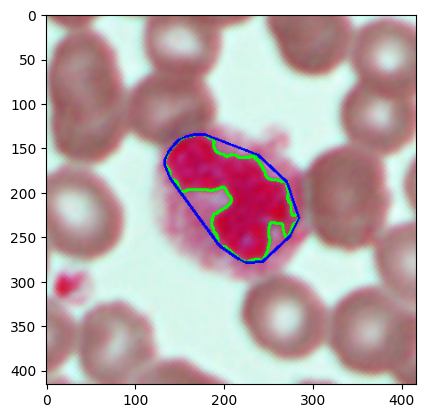

In [239]:
input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image15.jpg"
image = cv2.imread(input_path)
image_copy = image.copy()
image_copy = image.copy()

# plt.imshow(blurM)

lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)
# Define the lower and upper bounds for the green color in the HSV color space
lower_green = np.array([40, 130, 170])
upper_green = np.array([90, 255, 255])

# Threshold the HSV image based on the color range
img_mask = cv2.inRange(img_hsv, lower_green, upper_green)
img_mask_copy = img_mask.copy()
contours, _ = cv2.findContours(
    img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


def select_center_contour(contours):
    if len(contours) == 0:
        return None

# Compute the areas of all contours
    contour_areas = [cv2.contourArea(contour) for contour in contours]

    # Find the index of the contour with the largest area
    max_area_index = np.argmax(contour_areas)

    # Return the contour with the largest area
    center_contour = contours[max_area_index]
    area = cv2.contourArea(center_contour)
    perimeter = cv2.arcLength(center_contour, True)
    Nucleus_Areas.append(area)
    Nucleus_Perimeters.append(perimeter)

    return center_contour


# plt.imshow(img_mask_copy)
center_contour = select_center_contour(contours)
convex_hull = cv2.convexHull(center_contour)
# Draw the nucleus contour in green
cv2.drawContours(image_copy, [center_contour], 0, (0, 255, 0), 2)

# Draw the convex hull in red
cv2.drawContours(image_copy, [convex_hull], 0, (0, 0, 255), 2)
# cv2.imwrite("cytoplasm and nucleus.jpg",image_copy)
plt.imshow(image_copy)